<a href="https://colab.research.google.com/github/GeekAtArms/ONNX-MST-Image-Inpainting/blob/main/Convert_MST_inpainting_to_ONNX.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


![MST inpainting header image](https://github.com/ewrfcas/MST_inpainting/raw/main/assets/overview_new1.png)


## Clone repository

In [ ]:
%cd /content
!git clone https://github.com/ibaiGorordo/MST_inpainting.git
%cd MST_inpainting
!git checkout onnx

/content
Cloning into 'MST_inpainting'...
remote: Enumerating objects: 211, done.
remote: Counting objects: 100% (35/35), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 211 (delta 21), reused 21 (delta 11), pack-reused 176
Receiving objects: 100% (211/211), 13.80 MiB | 31.32 MiB/s, done.
Resolving deltas: 100% (81/81), done.
/content/MST_inpainting
Branch 'onnx' set up to track remote branch 'onnx' from 'origin'.
Switched to a new branch 'onnx'


## Import dependencies

In [ ]:
!pip3 install yacs gdown onnxsim onnx onnxruntime imread-from-url --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 2.0 MB 6.8 MB/s 
     |████████████████████████████████| 13.1 MB 49.6 MB/s 
     |████████████████████████████████| 4.9 MB 34.8 MB/s 
     |████████████████████████████████| 235 kB 57.9 MB/s 
     |████████████████████████████████| 46 kB 1.3 MB/s 
     |████████████████████████████████| 86 kB 5.8 MB/s 
     |████████████████████████████████| 51 kB 8.4 MB/s 
  Created wheel for gdown: filename=gdown-4.5.1-py3-none-any.whl size=14951 sha256=9880c8f654551f03cfe8a9fd7f7feb17e46dc51d6cb18983383d3466503d4fd0
  Stored in directory: /root/.cache/pip/wheels/3d/ec/b0/a96d1d126183f98570a785e6bf8789fca559853a9260e928e1
  Created wheel for imread-from-url: filename=imread_from_url-0.1.3-py3-none-any.whl size=6644 sha256=dca6c27210879c3673

## Select and download models

In [ ]:
%cd /content/MST_inpainting
%mkdir checkpoints
%cd checkpoints
model_type = 'MST_P2M' #@param ["MST_P2M", "MST_P2C", "MST_Shanghaitech"]

!gdown https://drive.google.com/uc?id=1ZE7pWCI-sTmNZvJOBy2DvL3m1qbybWcH

import gdown

if model_type == 'MST_P2M':
  encoder_url = "https://drive.google.com/uc?id=1wTNmBxaqDTmp0bA2okN_oW60JPIGPR80"
  encoder_output = "SharedWEModel_gen.pth"
  gdown.download(encoder_url, encoder_output, quiet=False)
  decoder_url = "https://drive.google.com/uc?id=1ZcNsq48aZzOmJ2v-nrFh9ugn4jCUaUkL"
  decoder_output = "InpaintingModel_gen.pth"
  gdown.download(decoder_url, decoder_output, quiet=False)
elif model_type == 'MST_P2C':
  encoder_url = "https://drive.google.com/uc?id=1UHwg1X59lN_v2ciPJH8oZs9ST4FXS7TJ"
  encoder_output = "SharedWEModel_gen.pth"
  gdown.download(encoder_url, encoder_output, quiet=False)
  decoder_url = "https://drive.google.com/uc?id=1ReOBa59-MKfeSprWJ8oTSOCWS2cfIO-s"
  decoder_output = "InpaintingModel_gen.pth"
  gdown.download(decoder_url, decoder_output, quiet=False)
elif model_type == 'MST_Shanghaitech':
  encoder_url = "https://drive.google.com/uc?id=16EdfpvVsdsgavE2zzxOPor_06MVEYuQJ"
  encoder_output = "SharedWEModel_gen.pth"
  gdown.download(encoder_url, encoder_output, quiet=False)
  decoder_url = "https://drive.google.com/uc?id=1NzP7gc2BG-_NaBEWwZV8seiBNjUNuZC-"
  decoder_output = "InpaintingModel_gen.pth"
  gdown.download(decoder_url, decoder_output, quiet=False)


/content/MST_inpainting
/content/MST_inpainting/checkpoints
Downloading...
From: https://drive.google.com/uc?id=1ZE7pWCI-sTmNZvJOBy2DvL3m1qbybWcH
To: /content/MST_inpainting/checkpoints/best_lsm_hawp.pth
100% 166M/166M [00:01<00:00, 86.3MB/s]


Downloading...
From: https://drive.google.com/uc?id=1wTNmBxaqDTmp0bA2okN_oW60JPIGPR80
To: /content/MST_inpainting/checkpoints/SharedWEModel_gen.pth
100%|██████████| 57.5M/57.5M [00:00<00:00, 61.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1ZcNsq48aZzOmJ2v-nrFh9ugn4jCUaUkL
To: /content/MST_inpainting/checkpoints/InpaintingModel_gen.pth
100%|██████████| 48.5M/48.5M [00:00<00:00, 61.9MB/s]


## HAWP Wrapper

In [ ]:
%cd /content/MST_inpainting

import numpy as np
import torch
import torch.nn as nn

from src.lsm_hawp.detector import WireframeDetector

class HAWP_Wrapper(nn.Module):
    def __init__(self, path, threshold, device='cuda'):
        super(HAWP_Wrapper, self).__init__()

        self.threshold = threshold

        self.model = WireframeDetector(is_cuda=device == 'cuda')
        self.model.load_state_dict(torch.load(path)['model'])
        self.model = self.model.to(device)
        self.model.eval()

    def forward(self, tensor):

        with torch.no_grad():

            output_masked = self.model(tensor)
            self.lines = output_masked['lines_pred']
            self.scores = output_masked['lines_score']
            return self.lines, self.scores

    def draw_lines(self, shape):

        lmap = np.zeros(shape)
        lines = self.lines[self.scores > self.threshold]
        lines = lines.cpu().detach().numpy()

        lines[:, 0::2] *= (shape[1]-1)
        lines[:, 1::2] *= (shape[0]-1)
        lines = lines.astype(np.int32)
        for line in lines:
            cv2.line(lmap, (line[0],line[1]), (line[2],line[3]),
                     (255, 255, 255), 1, cv2.LINE_AA)

        lmap = np.clip(lmap * 255, 0, 255).astype(np.uint8)
        return lmap

/content/MST_inpainting


## MST Wrapper

In [ ]:
%cd /content/MST_inpainting

import numpy as np
import torch
import torch.nn as nn

from src.model_inference import SharedWEModel, InpaintingModel

class MST_Wrapper(nn.Module):
    def __init__(self, config, concat_mask=False):
        super(MST_Wrapper, self).__init__()

        self.config = config
        self.concat_mask = concat_mask
        self.lsm_hawp = WireframeDetector(is_cuda=True if str(config.DEVICE) != 'cpu' else False)
        self.lsm_hawp = self.lsm_hawp.to(config.DEVICE)
        self.img_size = config.img_size
        self.hawp_size = config.hawp_size
        self.lsm_hawp.eval()
        self.structure_encoder = SharedWEModel(config, input_channel=6)
        self.inpaint_decoder = InpaintingModel(config, input_channel=7 if concat_mask else 6)

        self.results_path = 'results'

        self.structure_encoder.generator.load_state_dict(
            torch.load(self.structure_encoder.gen_weights_path)['generator'])
        self.inpaint_decoder.generator.load_state_dict(
            torch.load(self.inpaint_decoder.gen_weights_path)['generator'])

    def forward(self, img, mask, line_map, edge_map):

        self.structure_encoder.eval()
        self.inpaint_decoder.eval()

        meta_outputs = self.structure_encoder(img, line_map, edge_map, mask)

        img_out = meta_outputs['img_out'][-1]
        edge_out = meta_outputs['edge_out'][-1]

        outputs_merged = edge_out * 255.0
        outputs_merged = outputs_merged.permute(0, 2, 3, 1).int()
        outputs_merged = outputs_merged.cpu().detach().numpy().squeeze().astype(np.uint8)

        line_out = meta_outputs['line_out'][-1]
        lines_edges_pred = torch.clamp(line_out + edge_out, 0, 1)
        lines_preds = torch.clamp(line_map + line_out, 0, 1)
        edges_pred = edge_out * mask + edge_map * (1 - mask)

        infos = torch.cat([lines_preds, edges_pred, lines_edges_pred], dim=1)
        img_out = self.inpaint_decoder(img, infos, mask)

        return img_out, edges_pred, lines_preds

/content/MST_inpainting


## Utils functions

In [ ]:
%cd /content/MST_inpainting

import cv2
import torchvision

from utils.utils import Config

def init_config():
    config_path = "config.yml"
    config = Config(config_path)

    # test mode
    config.PATH = "./checkpoints"
    config.valid_th = 0.85
    config.mask_th = 0.8

    # init device
    if torch.cuda.is_available():
        config.DEVICE = torch.device("cuda")
        torch.backends.cudnn.benchmark = True
    else:
        config.DEVICE = torch.device("cpu")
    return config

def estimate_edges(img, shape):

    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_gray = cv2.resize(img_gray, (shape[1],shape[0]),
                          interpolation=cv2.INTER_AREA)
    smoothed_input = cv2.GaussianBlur(img_gray, (7, 7), 2)
    edge_map = cv2.Canny(smoothed_input, 35, 70)

    return edge_map

def get_masked_img(img):

    mask = np.zeros(img.shape[:2], dtype=np.uint8)
    mask[1000:1500, 1000:1500] = 255
    masked_img = img.copy()
    masked_img[mask == 255] = 255

    return mask, masked_img

def prepare_hawp_input_img(masked_img, mask, shape, device='cuda'):

    img = cv2.cvtColor(masked_img, cv2.COLOR_BGR2RGB)
    img[mask == 255] = 127.5

    img_tensor = prepare_input(img, shape, device)*255
    hawp_mean = torch.tensor([109.730, 103.832, 98.681]).to(device).reshape(1, 3, 1, 1)
    hawp_std = torch.tensor([22.275, 22.124, 23.229]).to(device).reshape(1, 3, 1, 1)
    img_tensor = (img_tensor - hawp_mean) / hawp_std

    return img_tensor

def prepare_input(input_img, shape, device='cuda'):
    img = cv2.resize(input_img, (shape[1],shape[0]), interpolation=cv2.INTER_AREA)
    if len(input_img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_tensor = to_tensor(img).to(device)
    input = img_tensor.unsqueeze(0)

    return input

def prepare_mask(input_img, shape, device='cuda'):
    img = cv2.resize(input_img, (shape[1],shape[0]), interpolation=cv2.INTER_NEAREST)

    img_tensor = to_tensor(img).to(device)
    input = img_tensor.unsqueeze(0)

    return input

def to_tensor(img):
    input = torchvision.transforms.functional.to_tensor(img).float()
    return input


/content/MST_inpainting


## Demo

/content/MST_inpainting


Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/fake_useragent/utils.py", line 154, in load
    for item in get_browsers(verify_ssl=verify_ssl):
  File "/usr/local/lib/python3.7/dist-packages/fake_useragent/utils.py", line 99, in get_browsers
    html = html.split('<table class="w3-table-all notranslate">')[1]
IndexError: list index out of range
/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Encoder Params: 14344274
Decoder Params: 12111043


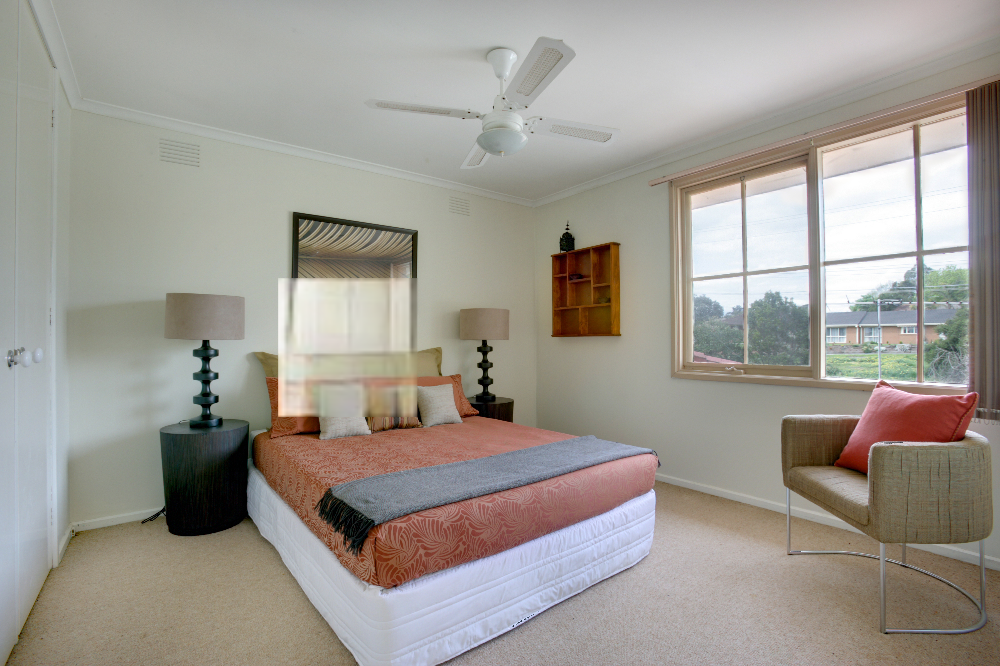

In [ ]:
%cd /content/MST_inpainting
import cv2
from google.colab.patches import cv2_imshow
from imread_from_url import imread_from_url

config = init_config()
concat_mask = 'P2C' in model_type

img = imread_from_url("https://upload.wikimedia.org/wikipedia/commons/0/0d/Bedroom_Mitcham.jpg")
mask, masked_img = get_masked_img(img)

hawp_path = "./checkpoints/best_lsm_hawp.pth"
hawp = HAWP_Wrapper(hawp_path, config.mask_th)

hawp_input_shape = (config.hawp_size,config.hawp_size)
hawp_input = prepare_hawp_input_img(masked_img, mask, hawp_input_shape)

input_shape = (256, 256) #height, width
lines_pred, lines_score = hawp(hawp_input)
line_map = hawp.draw_lines(input_shape)
edge_map = estimate_edges(masked_img, input_shape)

mst = MST_Wrapper(config, concat_mask)

input_img = prepare_input(masked_img, input_shape)
input_mask = prepare_mask(mask, input_shape)
input_line_map = prepare_input(line_map, input_shape)
input_edge = prepare_input(edge_map, input_shape)


output_img, edges_pred, lines_preds = mst(input_img, input_mask, input_line_map, input_edge)

output_img = output_img * 255.0
output_img = output_img.permute(0, 2, 3, 1).int()
output_img = output_img.cpu().detach().numpy().squeeze().astype(np.uint8)
output_img = cv2.cvtColor(output_img, cv2.COLOR_RGB2BGR)
output_img = cv2.resize(output_img, (img.shape[1], img.shape[0]))
output_img[mask == 0] = masked_img[mask == 0]
cv2_imshow(output_img)


## Convert to onnx

In [ ]:
%cd /content/MST_inpainting

import torch

onnx_file = f"{model_type}.onnx"
torch.onnx.export(mst,  # model being run
                  (input_img, input_mask, input_line_map, input_edge),  # model input (or a tuple for multiple inputs)
                  onnx_file,  # where to save the model (can be a file or file-like object)
                  export_params=True,  # store the trained parameter weights inside the model file
                  opset_version=16,  # the ONNX version to export the model to
                  input_names=['input_img', 'input_mask', 'input_line_map', 'input_edge_map'],  # the model's input names
                  output_names=['output_img', 'edges_pred',   'lines_preds'],  # the model's output names
                  do_constant_folding=True)

/content/MST_inpainting


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: TracerWarning: Converting a tensor to a NumPy array might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!


## Simplify ONNX model

In [ ]:
%cd /content/MST_inpainting

from onnxsim import simplify
import onnx

# load your predefined ONNX model
model = onnx.load(onnx_file)

# convert model
model_simp, check = simplify(model)

# save simplified model
simp_model = f"{onnx_file[:-5]}_simp.onnx"
onnx.save(model_simp, simp_model)

/content/MST_inpainting


## Download MST ONNX model

In [ ]:
%cd /content/MST_inpainting

from google.colab import files
files.download(simp_model)

/content/MST_inpainting


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Convert HAWP model to ONNX


In [ ]:
%cd /content/MST_inpainting
import numpy as np
import torch

hawp_onnx_file = "hawp.onnx"
torch.onnx.export(hawp,  # model being run
                  hawp_input,  # model input (or a tuple for multiple inputs)
                  hawp_onnx_file,  # where to save the model (can be a file or file-like object)
                  export_params=True,  # store the trained parameter weights inside the model file
                  opset_version=16,  # the ONNX version to export the model to
                  input_names=['hawp_input'],  # the model's input names
                  output_names=['lines_pred', 'lines_score'],  # the model's output names
                   dynamic_axes={'lines_pred' : {0 : 'num_lines'},    # variable length axes
                                'lines_score' : {0 : 'num_lines'}},
                  do_constant_folding=True)

from onnxsim import simplify
import onnx

# load your predefined ONNX model
model = onnx.load(hawp_onnx_file)

# convert model
model_simp, check = simplify(model)

# save simplified model
hawp_simp_model = f"{hawp_onnx_file[:-5]}_simp.onnx"
onnx.save(model_simp, hawp_simp_model)

import onnxruntime
session = onnxruntime.InferenceSession(hawp_simp_model, providers=['CPUExecutionProvider'])

model_inputs = session.get_inputs()
input_names = [model_inputs[i].name for i in range(len(model_inputs))]
input_shape = model_inputs[0].shape

model_outputs = session.get_outputs()
output_names = [model_outputs[i].name for i in range(len(model_outputs))]

input = np.zeros((input_shape), dtype=np.float32)
outputs = session.run(output_names, {input_names[0]: input})


/content/MST_inpainting


/content/MST_inpainting/src/lsm_hawp/stacked_hg.py:161: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if x.shape[2] >= 256:
/content/MST_inpainting/src/lsm_hawp/detector.py:137: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  assert batch_size == 1
/content/MST_inpainting/src/lsm_hawp/detector.py:206: TracerWarning: torch.tensor results are registered as constants in the trace. You can safely ignore this warning if you use this function to create tensors out of constant variables that would be the same every time you call this function. In any other case

## Download HAWP ONNX model

In [ ]:
%cd /content/MST_inpainting

from google.colab import files
files.download(hawp_simp_model)

/content/MST_inpainting


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>